# Codigo para los SIN  MINI HALOS
# COEVAL

In [1]:
pip show 21cmFAST

Name: 21cmFAST
Version: 0.0.0
Summary: A semi-numerical cosmological simulation code for the 21cm signal
Home-page: https://github.com/21cmFAST/21cmFAST
Author: The 21cmFAST coredev team
Author-email: 21cmfast.coredev@gmail.com
License: MIT license
Location: /home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages
Requires: astropy, bidict, cached-property, cffi, click, h5py, matplotlib, numpy, pyyaml, scipy
Required-by: 21CMMC
Note: you may need to restart the kernel to use updated packages.


## __________________________________________________________________
## PARTE I : Rutinas
## PARTE II : Genero el cubo de DATOS (Coeval)
## PARTE III: Analisis de datos - Visualizacion de los campos en 2D y 3D
## PARTE IV: Tomografias ( $\delta$ , $\delta Tb$ , Tk, XHII )  junto a los Halos
## PARTE V:  Generamos el Lightcone
## __________________________________________________________________

# PARTE I

In [2]:
import numpy as np

In [3]:
%matplotlib inline
import matplotlib.pyplot as plt
import os

import py21cmfast as p21c

# For plotting the cubes, we use the plotting submodule:
from py21cmfast import plotting

# For interacting with the cache
from py21cmfast import cache_tools

import h5py
import numpy as np

/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_cfg.py:57: UserWarning: Your configuration file is out of date. Updating...
  warnings.warn(
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_cfg.py:41: UserWarning: Your configuration file is out of date. Updating...
  warnings.warn("Your configuration file is out of date. Updating...")


In [4]:
#import shutil

#cache_dir = '_cache'
#if os.path.exists(cache_dir):
#    shutil.rmtree(cache_dir)

In [5]:
if not os.path.exists('_cache'):
    os.mkdir('_cache')

p21c.config['direc'] = '_cache'
cache_tools.clear_cache(direc="_cache")

In [6]:
from py21cmfast import (
    AstroParams,
    CosmoParams,
    FlagOptions,
    UserParams,
    determine_halo_list,
    initial_conditions,
    perturb_field,
)

from py21cmfast._utils import StructInstanceWrapper
from py21cmfast.c_21cmfast import ffi, lib
import numpy as np

## Condiciones iniciales :  IC

In [7]:
initial_conditions = p21c.initial_conditions(            
         user_params = {                
        "BOX_LEN": 160.0,
        "DIM": 1024,
        "HII_DIM": 256,
        "NON_CUBIC_FACTOR": 1.0,
        "USE_FFTW_WISDOM": True,
        "HMF": 1,
        "USE_RELATIVE_VELOCITIES": True,
        "POWER_SPECTRUM": 5,
        "N_THREADS": 6,
        "PERTURB_ON_HIGH_RES": True,
        "NO_RNG": False,
        "USE_INTERPOLATION_TABLES": True,
        "FAST_FCOLL_TABLES": True,
        "USE_2LPT": True,
        "MINIMIZE_MEMORY": False,
        #"KEEP_3D_VELOCITIES": False,
    },         
        
        cosmo_params = { "OMb":0.0486, 
        "OMm": 0.31, 
        "POWER_INDEX": 0.97, 
        "SIGMA_8": 0.81, 
        "hlittle": 0.68, 
         },
    
        random_seed = 902495069184, 
        
        regenerate=False,
        write=True,
    )

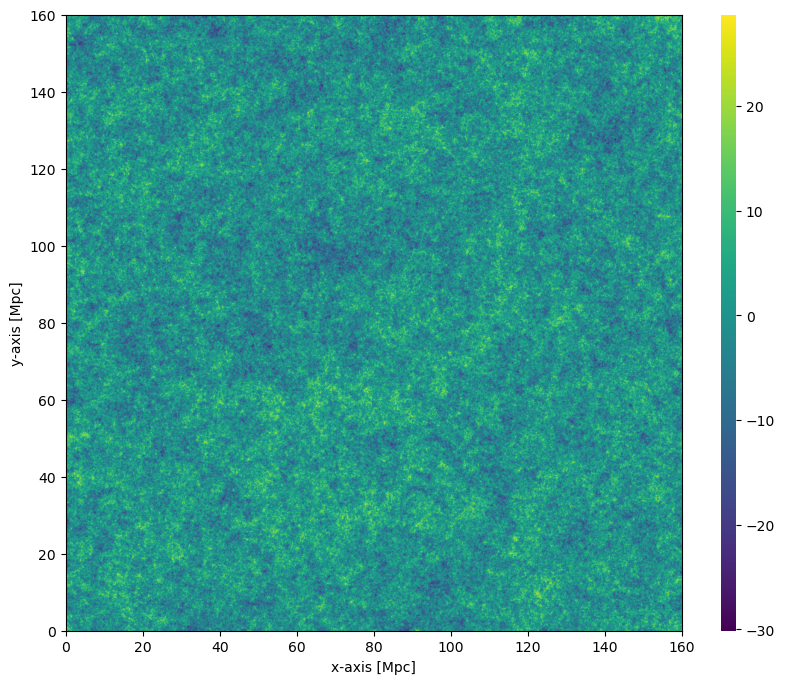

In [25]:
# SIN MINI HALOS
fig, ax = plt.subplots(figsize=(10, 8))  # 
im = plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=0, cbar=True, cmap='viridis', ax=ax)
#plotting.coeval_sliceplot(initial_conditions, "hires_density",slice_index=0 );
plt.savefig('IC SIN mini Halos.jpg', dpi=300, bbox_inches='tight')

In [8]:
p21c.CosmoParams._defaults_

{'SIGMA_8': 0.8102,
 'hlittle': 0.6766,
 'OMm': 0.30964144154550644,
 'OMb': 0.04897468161869667,
 'POWER_INDEX': 0.9665}

In [9]:
initial_conditions.cosmo_params

CosmoParams(OMb:0.0486, OMm:0.31, POWER_INDEX:0.97, SIGMA_8:0.81, hlittle:0.68)

In [10]:
initial_conditions.cosmo_params.cosmo

FlatLambdaCDM(name="Planck15 (modified)", H0=68.0 km / (Mpc s), Om0=0.31, Tcmb0=2.7255 K, Neff=3.046, m_nu=[0.   0.   0.06] eV, Ob0=0.0486)

In [11]:
print(initial_conditions)

InitialConditions(UserParams(BOX_LEN:160, DIM:1024, FAST_FCOLL_TABLES:True, HII_DIM:256, HMF:1, MINIMIZE_MEMORY:False, NON_CUBIC_FACTOR:1, NO_RNG:False, N_THREADS:6, PERTURB_ON_HIGH_RES:True, POWER_SPECTRUM:5, USE_2LPT:True, USE_FFTW_WISDOM:True, USE_INTERPOLATION_TABLES:True, USE_RELATIVE_VELOCITIES:True);
	CosmoParams(OMb:0.0486, OMm:0.31, POWER_INDEX:0.97, SIGMA_8:0.81, hlittle:0.68);
	random_seed:902495069184)


In [12]:
initial_conditions.fieldnames

['lowres_density',
 'lowres_vx',
 'lowres_vy',
 'lowres_vz',
 'lowres_vx_2LPT',
 'lowres_vy_2LPT',
 'lowres_vz_2LPT',
 'hires_density',
 'hires_vx',
 'hires_vy',
 'hires_vz',
 'hires_vx_2LPT',
 'hires_vy_2LPT',
 'hires_vz_2LPT',
 'lowres_vcb']

#  ____________________________________________________________

# PARTE II
# _______________________Genero el Coeval_______________________
## En este caso usamos el USE_MINI_HALOS 

In [13]:
coeval = p21c.run_coeval(
    redshift = 10,
    random_seed = initial_conditions.random_seed,
    user_params = initial_conditions.user_params,                              
 
    flag_options={ 
        "USE_HALO_FIELD": True,
        "USE_MINI_HALOS": False,
        "USE_CMB_HEATING": True,
        "USE_LYA_HEATING": True,
        "USE_MASS_DEPENDENT_ZETA": True, # mini = True, Halos= False
        "SUBCELL_RSD": False,
        "APPLY_RSDS": True,
        "INHOMO_RECO": True,
        "USE_TS_FLUCT": True,
        "M_MIN_in_Mass": True,
        "PHOTON_CONS": False,
        "FIX_VCB_AVG": True, # mini = True, Halos= False
    } , 
    
    
    cosmo_params = initial_conditions.cosmo_params,
    
    astro_params ={
        "HII_EFF_FACTOR": 30.0,
        "F_STAR10": -1.3,
        "F_STAR7_MINI": -2.22, # use estandard = -2.22
        "ALPHA_STAR": 0.5,
        "ALPHA_STAR_MINI": 0.5,
        "F_ESC10": -1.0,
        "F_ESC7_MINI": -2.5,
        "ALPHA_ESC": -0.5,
        "M_TURN": 8.7,
        "R_BUBBLE_MAX": None,
        "ION_Tvir_MIN": 4.69897,
        "L_X": 40.0,
        "L_X_MINI": 40.0,
        "NU_X_THRESH": 500.0,
        "X_RAY_SPEC_INDEX": 1.0,
        "X_RAY_Tvir_MIN": None,
        "F_H2_SHIELD": 0.0,
        "t_STAR": 0.5,
        "N_RSD_STEPS": 20,
        "A_LW": 2.00,
        "BETA_LW": 0.6,
        "A_VCB": 1.0,
        "BETA_VCB": 1.8,
    },
 
    regenerate=False,
    write=True,
    direc=None,
    
)

/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:400: UserWarning: The following parameters to FlagOptions are not supported: ['USE_VELS_AUX', 'APPLY_RSDS']
  warnings.warn(
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:815: UserWarning: Trying to remove array that isn't yet created: lowres_density
  warnings.warn(f"Trying to remove array that isn't yet created: {k}")
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:815: UserWarning: Trying to remove array that isn't yet created: lowres_vx
  warnings.warn(f"Trying to remove array that isn't yet created: {k}")
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:815: UserWarning: Trying to remove array that isn't yet created: lowres_vy
  warnings.warn(f"Trying to remove array that isn't yet created: {k}")
/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.

In [14]:
!python --version

Python 3.10.11


In [15]:
coeval.astro_params.pystruct

{'HII_EFF_FACTOR': 30.0,
 'F_STAR10': 0.05011872336272722,
 'ALPHA_STAR': 0.5,
 'ALPHA_STAR_MINI': 0.5,
 'F_ESC10': 0.1,
 'ALPHA_ESC': -0.5,
 'M_TURN': 501187233.6272715,
 'F_STAR7_MINI': 0.006025595860743574,
 'F_ESC7_MINI': 0.0031622776601683794,
 'R_BUBBLE_MAX': 50.0,
 'ION_Tvir_MIN': 49999.9995007974,
 'F_H2_SHIELD': 0.0,
 'L_X': 1e+40,
 'L_X_MINI': 1e+40,
 'NU_X_THRESH': 500.0,
 'X_RAY_SPEC_INDEX': 1.0,
 'X_RAY_Tvir_MIN': 49999.9995007974,
 'A_LW': 2.0,
 'BETA_LW': 0.6,
 'A_VCB': 1.0,
 'BETA_VCB': 1.8,
 't_STAR': 0.5,
 'N_RSD_STEPS': 20}

# _________________________________________________________________

# PARTE III
# Analisis de DATOS

## 1 - Campo de densidad

In [16]:
type(coeval)

py21cmfast.outputs.Coeval

In [17]:
coeval.random_seed

902495069184

In [18]:
coeval.random_seed

902495069184

In [19]:
coeval.density

array([[[ 1.78154334e-01,  3.16688538e+00,  1.63773298e+00, ...,
          1.06062746e+00,  2.53098154e+00,  2.69611025e+00],
        [ 4.40868855e+00,  3.17192411e+00,  1.50630832e+00, ...,
          1.57512450e+00,  1.80094886e+00,  2.12269354e+00],
        [ 3.43095064e+00,  1.09092152e+00,  2.68652868e+00, ...,
          1.62173605e+00,  4.83883262e-01,  7.61145771e-01],
        ...,
        [-1.35572776e-01,  4.11267787e-01,  1.92954838e-01, ...,
          4.25234377e-01,  1.45521283e+00,  8.53353739e-01],
        [ 1.02573507e-01,  2.51755118e-01, -4.60902005e-02, ...,
         -4.05125618e-02, -2.89324373e-02,  4.41954061e-02],
        [-6.46514446e-02,  1.26841044e+00,  1.35269594e+00, ...,
          2.58728653e-01,  2.65143633e-01, -3.81286800e-01]],

       [[ 3.79179299e-01,  1.42922893e-01,  4.42565352e-01, ...,
          4.33561593e-01,  7.88339496e-01,  3.82016450e-01],
        [ 1.36301887e+00,  1.17953944e+00,  7.59521186e-01, ...,
          1.07888266e-01,  5.94075263e

In [20]:
coeval.density.shape

(256, 256, 256)

In [21]:
# densisad CON mini halos

#plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=6)
#plt.savefig('density SIN mini.jpg', dpi=300, bbox_inches='tight')


#fig, ax = plt.subplots(figsize=(10, 8))  # Ajusta el tamaño de la figura
#im = plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=0, cbar=True, cmap='viridis', ax=ax)

# PARTE III-A

#  PLOTS : De los distintos campos generados del COEVAL
## PLOT : Campo de  DENSIDAD   ($\delta$)

In [30]:
#plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=0)

#plt.savefig('densitySINmini.jpg', dpi=300, bbox_inches='tight')

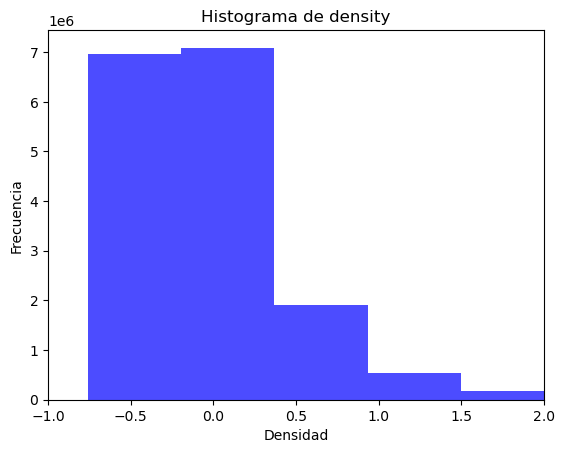

In [27]:
import matplotlib.pyplot as plt
plt.hist(coeval.density.flatten(), bins=30, color='blue', alpha=0.7)
plt.title('Histograma de density')
plt.xlabel('Densidad')
plt.xlim(-1,2)
plt.ylabel('Frecuencia')
plt.show()

In [28]:
#plt.hist(coeval.density.flatten())

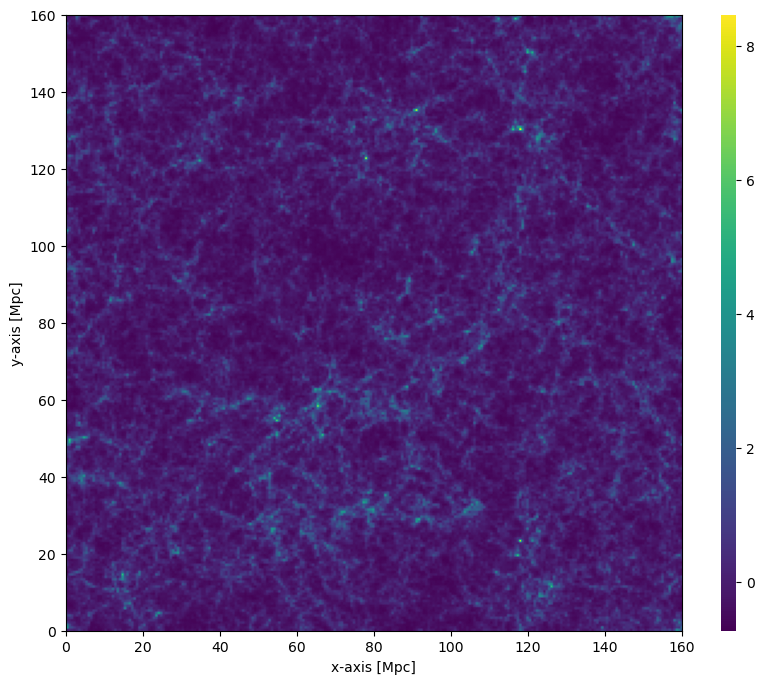

In [29]:
#plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=0)

fig, ax = plt.subplots(figsize=(10, 8))  # 
im = plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=0, cbar=True, cmap='viridis', ax=ax)



plt.savefig('densitySINmini.jpg', dpi=300, bbox_inches='tight')

## PLOT : Temperatura de BRILLO  ($\Delta Tb$)

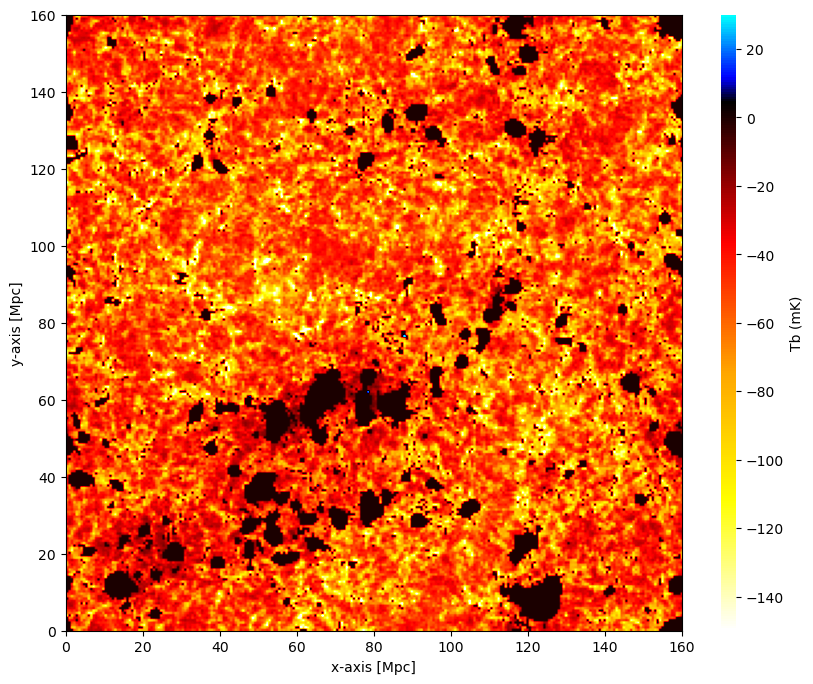

In [31]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=0, cbar=True, ax=ax, cbar_label='Tb (mK)')
#plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=0, cbar_label='')
plt.savefig('brightness_temp SIN mini.jpg', dpi=300, bbox_inches='tight')

In [33]:
#coeval.brightness_temp

In [34]:
#plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=0)
#plt.savefig('brightness_tempSINmini.jpg', dpi=300, bbox_inches='tight')

## PLOT: Temperatura cinetica del GAS   (Tk)

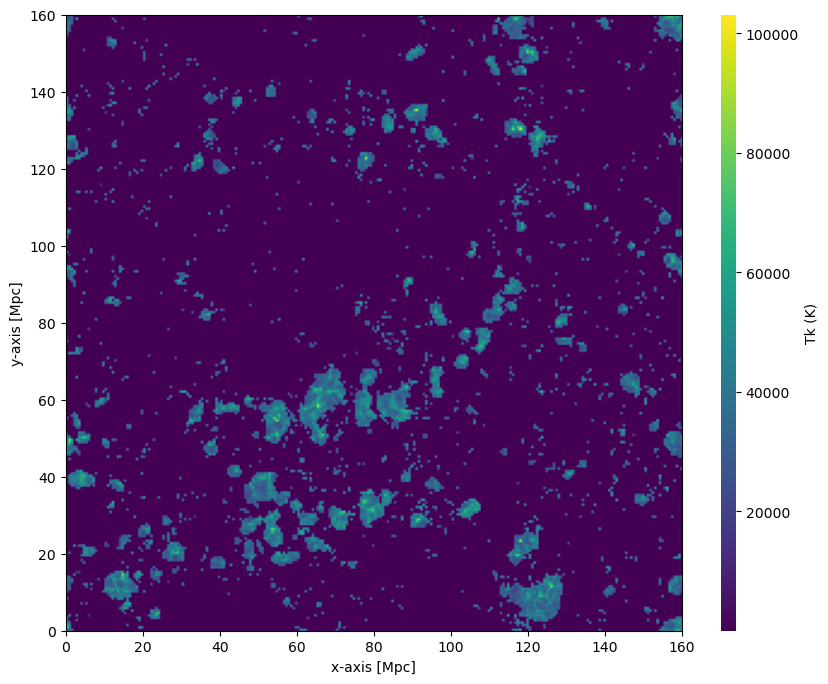

In [35]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=0, cbar=True, ax=ax, cbar_label='Tk (K)')
#plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=0)
plt.savefig('temp_kinetic SIN mini.jpg', dpi=300, bbox_inches='tight')

In [36]:
#coeval.temp_kinetic_all_gas

## PLOT:  Campo IONIZANTE  ( XHII )

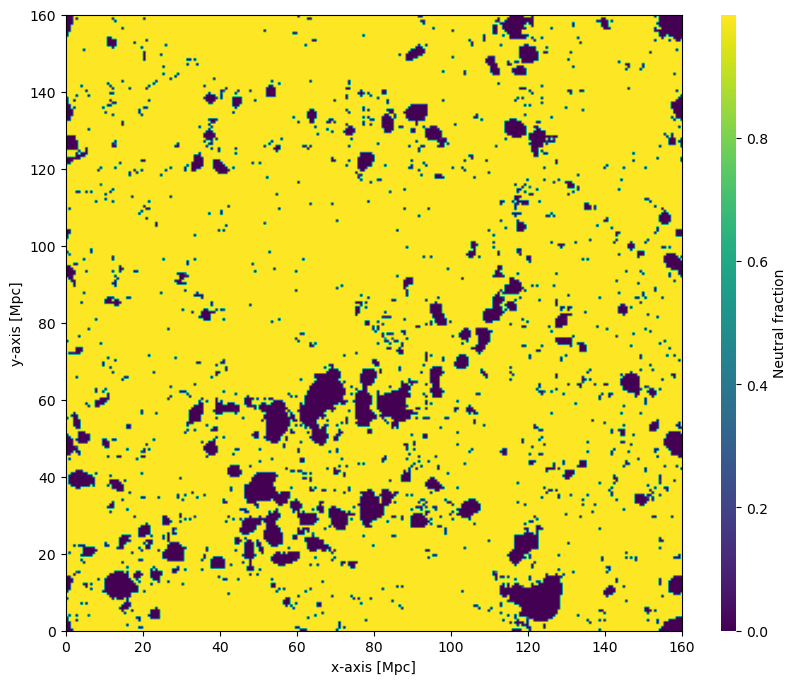

In [37]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
#plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=0)
plt.savefig('Ionizante SIN mini.jpg', dpi=300, bbox_inches='tight')

In [39]:
#coeval.xH_box

In [40]:
#plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6)
#plt.savefig('IonizanteSINmini.jpg', dpi=300, bbox_inches='tight')

## PLOT:  Temperatura de SPIN  (Ts)

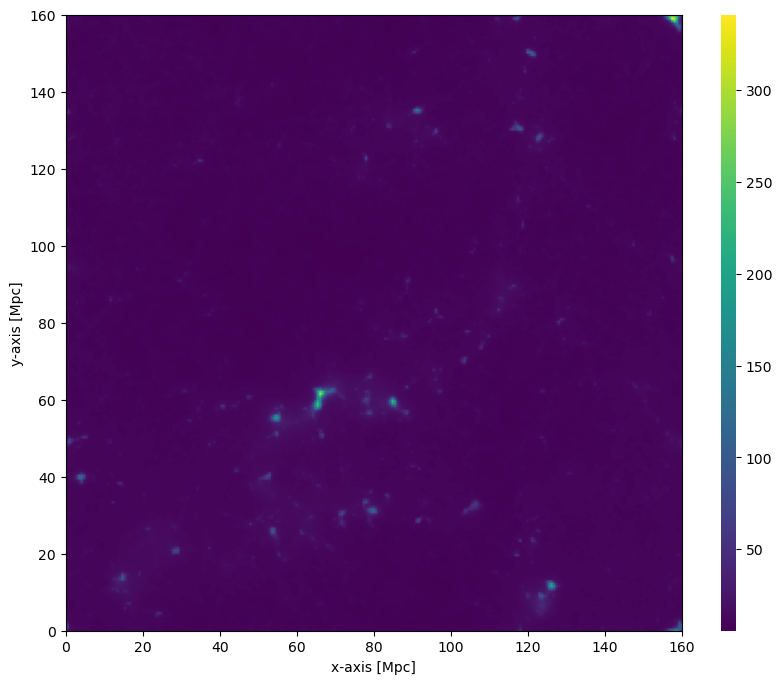

In [41]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "Ts_box", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
#plotting.coeval_sliceplot(coeval, "Ts_box",slice_axis=-1, slice_index=0)
plt.savefig('temp_spin SIN mini.jpg', dpi=300, bbox_inches='tight')

In [205]:
# comprobando que todo este bien...
#plotting.coeval_sliceplot(coeval, "Ts_box")

In [42]:
#coeval.Ts_box

# PARTE III-B

## 2 - Halos de DM

### 2.1 -  Primero genero los halos de DM
### 2.2 a- Visualizaicon de los datos : PLot de densidad ($\delta$) en 2D y 3D
### 2.2 b- Visualizaicon de los datos : PLot de los Halos en 2D y3D
### 2.2 c - Visualizacion de los datos : Densidad y halos en 3D 

## 2 -1 Genero la lista de HALOS

In [43]:
halos = determine_halo_list(
        redshift= coeval.redshift ,
        init_boxes= initial_conditions,
        user_params=coeval.user_params,
        cosmo_params=coeval.cosmo_params,
        astro_params=coeval.astro_params,
        flag_options=coeval.flag_options,
        regenerate=False,
        write=True,
        OPTIMIZE=False,
    )


/home/ogarcia/miniconda3/envs/tesis3/lib/python3.10/site-packages/py21cmfast/_utils.py:400: UserWarning: The following parameters to FlagOptions are not supported: ['USE_VELS_AUX']
  warnings.warn(


In [44]:
halos.halo_masses.shape

(1403480,)

In [48]:
halos.halo_masses.min()

506199140.0

In [49]:
halos.halo_masses.max()

205145130000.0

In [50]:
halos.halo_coords.shape

(1403480, 3)

In [51]:
halos.halo_coords

array([[   0,    0,    5],
       [   0,    0,  277],
       [   0,    0,  672],
       ...,
       [1023, 1022,    5],
       [1023, 1023,    0],
       [1023, 1023,    4]], dtype=int32)

##  ● PLot 3D de los HALOS

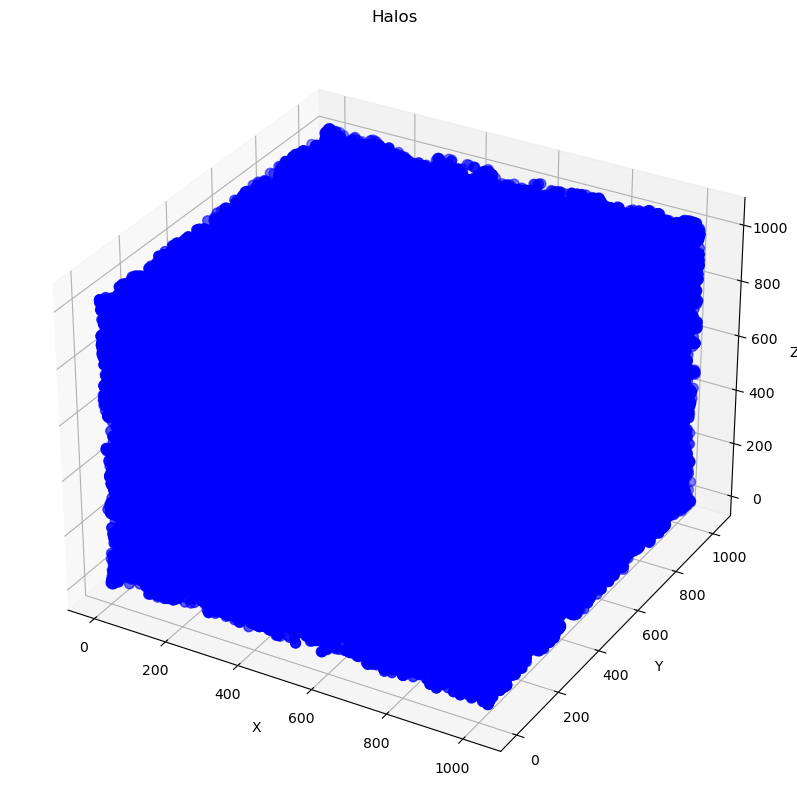

In [52]:
# PLOTS EN 3D  DEL LOS HALOS
#  Cuidado con las dimensiones !!!

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D


datos =  halos.halo_coords 

#las coordenadas x, y, z de los datos
x_1 = datos[:, 0]
y_2 = datos[:, 1]
z_3 = datos[:, 2]

# PLot

fig = plt.figure(figsize=(12, 10))   

ax = fig.add_subplot(111, projection='3d')

ax.scatter(x_1, y_2, z_3, c='b', marker='o',s=50)

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')
ax.set_title('Halos')

#plt.savefig('Halos Sin mini halos  3D.jpg', dpi=300, bbox_inches='tight')


plt.show()

In [53]:
x_1

array([   0,    0,    0, ..., 1023, 1023, 1023], dtype=int32)

In [54]:
y_2

array([   0,    0,    0, ..., 1022, 1023, 1023], dtype=int32)

In [55]:
z_3

array([  5, 277, 672, ...,   5,   0,   4], dtype=int32)

### Acordate que :


En el el código 21cmFAST, el número DIM= `809` se refiere al índice en la cuadrícula (o rejilla) que definimos en la simulación. o sea, teniamos....

1. Definición del tamaño del BOX: En esta configuración, definimos un `BOX_LEN` de 150.0 Mpc. Esto significa que la simulación abarca un volumen cúbico de 150 Mpc en cada dimensión (X, Y, Z).

2. Definición de la cuadrícula: La dimensión de la cuadrícula (`DIM`) a 812. Esto significa que el espacio de la simulación se divide en una cuadrícula de $( 812 \times 812 \times 812 )$ celdas.

3. Resolución de la cuadrícula: Cada celda de la cuadrícula representa una parte del volumen total. La resolución de cada celda en términos de longitud es:
   $
   \text{Resolución} = \frac{\text{BOX\_LEN}}{\text{DIM}} = \frac{150.0 \text{ Mpc}}{812} \approx 0.184 \text{ Mpc/celda}
   $

4. Interpretación de las coordenadas: Los índices  (por ejemplo, `809`) son posiciones dentro de esta cuadrícula. Por lo tanto, un índice de `809` en una dimensión representa una posición muy cercana al borde del box, pero no más allá de él.

   - Posición física: Para convertir un índice a una posición física en Mpc, usamos la fórmula:
     $\
     \text{Posición en Mpc} = \text{Índice} \times \text{Resolución} - \frac{\text{BOX\_LEN}}{2}
     \$
     
     En este caso, para el índice `809` en una dimensión:
       $\
       \text{Posición en Mpc} = 809 \times 0.184 - \frac{150.0}{2} \approx 148.56 - 75 = 73.56 \text{ Mpc}
       \$
       
       
       Esto indica que el índice `809` está muy cerca del borde superior del box en esa dimensión.



In [56]:
x_1.max()

1023

In [57]:
y_2.max()

1023

In [58]:
z_3.max()

1023

In [59]:
halos.halo_coords.max()

1023

### Halos en rebanadas 2D, en coordenadas  (DIM,DIM,DIM)

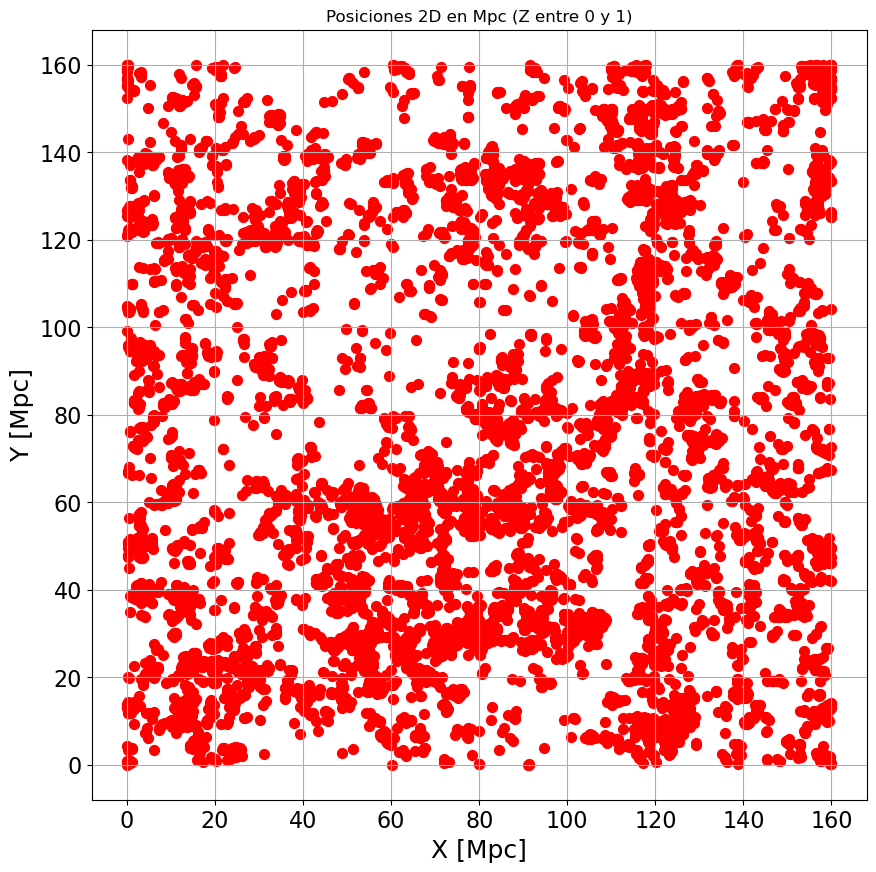

In [61]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM_1 = halos.halo_coords.max()
#DIM_1 = 255
DIM_1 = 1023

# Nuevos nombres para las coordenadas de halos
halo_x_indices = x_1
halo_y_indices = y_2
halo_z_indices = z_3

# Función para convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM_):
    return (BOX_LEN / DIM_1) * index



# Convertir índices a posiciones en Mpc
positions_x_mpc = index_to_mpc(halo_x_indices, BOX_LEN, DIM_1)
positions_y_mpc = index_to_mpc(halo_y_indices, BOX_LEN, DIM_1)
positions_z_mpc = index_to_mpc(halo_z_indices, BOX_LEN, DIM_1)

zmin = 0  # Mínimo valor de z en Mpc
zmax = 1 # Máximo valor de z en Mpc

 
mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)

 
filtered_positions_x_mpc = positions_x_mpc[mask]
filtered_positions_y_mpc = positions_y_mpc[mask]


plt.figure(figsize=(10, 10))
plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='r', marker='o', s=50)
plt.xlabel('X [Mpc]', fontsize=18)
plt.ylabel('Y [Mpc]', fontsize=18)

#plt.xlabel('X (Mpc)')
#plt.ylabel('Y (Mpc)')
plt.title(f'Posiciones 2D en Mpc (Z entre {zmin} y {zmax})')
plt.grid(True)
plt.tick_params(axis='both', labelsize=16)  



plt.savefig('Halos Sin mini halos.jpg', dpi=300, bbox_inches='tight')

plt.show()

## ● Cambio de coordenadas para los HALOS

## <span style="color: red;">El problema aca es que tengo un box de 256x256x256 incrustado en 150x150x150.</span>


In [62]:
import numpy as np

# Parámetros de la simulación

BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()
DIM = 1023  


#BOX_LEN = 160.0  # Mpc
#DIM = 254  # Número de celdas en una dimensión

#BOX_LEN = coeval.user_params.BOX_LEN # Mpc
#DIM = coeval.user_params.DIM
#DIM = 255


indices_x = x_1
indices_y = y_2
indices_z = z_3

# ahora convierto los índices a posiciones en Mpc, o sea defino una funcion para transformar ls coordenadas
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN/DIM)*index
    #return (index / DIM) * BOX_LEN


positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

#print("Posiciones en Mpc para x:")
#print(positions_x_mpc)

#print("Posiciones en Mpc para y:")
#print(positions_y_mpc)

#print("Posiciones en Mpc para z:")
#print(positions_z_mpc)


if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)
    print("Posiciones 3D en Mpc:")
    print(positions_3d_mpc)

    
    

Posiciones 3D en Mpc:
[[  0.           0.           0.78201369]
 [  0.           0.          43.32355816]
 [  0.           0.         105.1026393 ]
 ...
 [160.         159.84359726   0.78201369]
 [160.         160.           0.        ]
 [160.         160.           0.62561095]]


In [63]:
print("Posiciones en Mpc para x:")
print(positions_x_mpc)

Posiciones en Mpc para x:
[  0.   0.   0. ... 160. 160. 160.]


In [64]:
positions_x_mpc.shape

(1403480,)

In [65]:
print("Posiciones en Mpc para y:")
print(positions_y_mpc)

Posiciones en Mpc para y:
[  0.           0.           0.         ... 159.84359726 160.
 160.        ]


In [66]:
positions_y_mpc.max()

160.0

In [67]:
print("Posiciones en Mpc para z:")
print(positions_z_mpc)


Posiciones en Mpc para z:
[  0.78201369  43.32355816 105.1026393  ...   0.78201369   0.
   0.62561095]


In [68]:
positions_z_mpc.max()

160.0

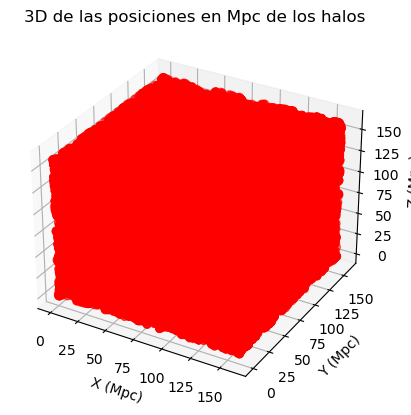

In [69]:
if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)
    #print("Posiciones 3D en Mpc:")
    #print(positions_3d_mpc)

    # Crear un gráfico 3D
    fig = plt.figure()
    ax = fig.add_subplot(111, projection='3d')

    # Graficar los puntos en 3D
    ax.scatter(positions_x_mpc, positions_y_mpc, positions_z_mpc, c='r', marker='o',s=30)

    # Etiquetas de los ejes
    ax.set_xlabel('X (Mpc)')
    ax.set_ylabel('Y (Mpc)')
    ax.set_zlabel('Z (Mpc)')

    # Título del gráfico
    ax.set_title('3D de las posiciones en Mpc de los halos')

    
    plt.savefig('Halos Sin mini halos  3D.jpg', dpi=300, bbox_inches='tight')

    # Mostrar el gráfico
    plt.show()

# PARTE III-C

# Cambio de coordenadas para el cubo de densidad

### Ejemplos:

### Notar que las dimensiones del plot 3D de "densidad"  son 

### 64x64x64 para DIM=256 y HII_DIM = 64
### 256x256x256 para DIM=512 y HII_DIM=256
### 456x456x456 para HII_DIM=456


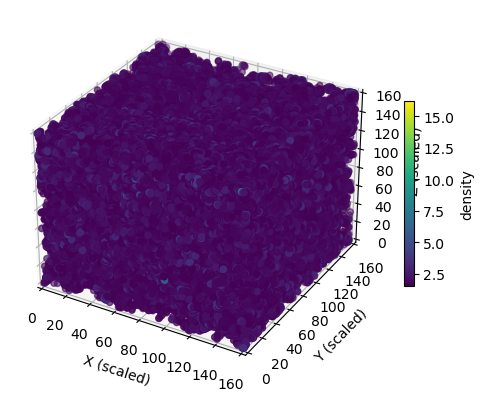

In [70]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# Suponiendo que 'coevel' es un objeto que contiene 'density' y 'user_params'
data_cube = coeval.density

umbral = 1.5

# Aplicar máscara para filtrar datos
mask = data_cube > umbral
data_cube_masked = np.where(mask, data_cube, np.nan)

# Definir los parámetros con nuevos nombres
#HII_DIM_ini = 127  # Dimensión original
HII_DIM_ini = 255  # Dimensión original

BOX_ini = 160  # Nueva dimensión


# Función para escalar índices
#def scale_indices(indices, original_dim, new_dim):
#    return (indices / original_dim) * new_dim


# Función para escalar índices
def scale_indices(indices, HII_DIM_ini, BOX_ini):
    return (indices / HII_DIM_ini) * BOX_ini



# Obtener las coordenadas de los índices que cumplen con la máscara
x_indices, y_indices, z_indices = np.where(mask)

# Escalar las coordenadas
x_scaled = scale_indices(x_indices, HII_DIM_ini, BOX_ini)
y_scaled = scale_indices(y_indices, HII_DIM_ini, BOX_ini)
z_scaled = scale_indices(z_indices, HII_DIM_ini, BOX_ini)

# Plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(x_scaled, y_scaled, z_scaled, c=data_cube_masked[x_indices, y_indices, z_indices], cmap='viridis')
cbar = plt.colorbar(scatter, shrink=0.5)
cbar.set_label('density')

ax.set_xlabel('X (scaled)')
ax.set_ylabel('Y (scaled)')
ax.set_zlabel('Z (scaled)')

# Ajustar límites de los ejes
ax.set_xlim([0, BOX_ini])
ax.set_ylim([0, BOX_ini])
ax.set_zlim([0, BOX_ini])

plt.rcParams["figure.figsize"] = (10, 10)
plt.show()


# _______________________________________________________________

## Fraccion  de colapso de gas, para mini halos y halos

In [71]:
coeval.Fcoll.shape

(1, 256, 256, 256)

In [72]:
coeval.Fcoll

array([[[[1.22576296e-01, 9.16778520e-02, 0.00000000e+00, ...,
          2.52862703e-02, 2.74788648e-01, 1.87636558e-02],
         [1.92673579e-02, 0.00000000e+00, 4.84609678e-02, ...,
          0.00000000e+00, 0.00000000e+00, 5.55813871e-02],
         [2.08326019e-02, 0.00000000e+00, 9.36267286e-10, ...,
          3.52088213e-02, 1.70968271e-08, 1.67801506e-08],
         ...,
         [7.62104246e-09, 0.00000000e+00, 0.00000000e+00, ...,
          1.03279136e-08, 6.28875896e-10, 6.77585854e-09],
         [0.00000000e+00, 0.00000000e+00, 5.34904849e-08, ...,
          6.39471196e-08, 1.71763794e-08, 0.00000000e+00],
         [1.12250795e-08, 6.36629984e-02, 0.00000000e+00, ...,
          4.13953960e-02, 0.00000000e+00, 3.85882757e-08]],

        [[0.00000000e+00, 4.68326977e-09, 0.00000000e+00, ...,
          1.80999447e-08, 1.14922782e-09, 4.39438486e-10],
         [1.01061017e-08, 0.00000000e+00, 0.00000000e+00, ...,
          2.60150679e-09, 0.00000000e+00, 2.05900941e-09],
        

# PARA HALOS

In [73]:
coeval.Fcoll.shape

(1, 256, 256, 256)

In [74]:
coeval.Fcoll.mean()

0.004596587

In [75]:
coeval.Fcoll.max()

8.438827

In [76]:
coeval.Fcoll.min()

0.0

In [77]:
coeval.density.max()

16.166258

In [78]:
coeval.density.min()

-0.75955707

In [79]:
coeval.density.mean()

-2.0239146e-05

# Fcoll  3D

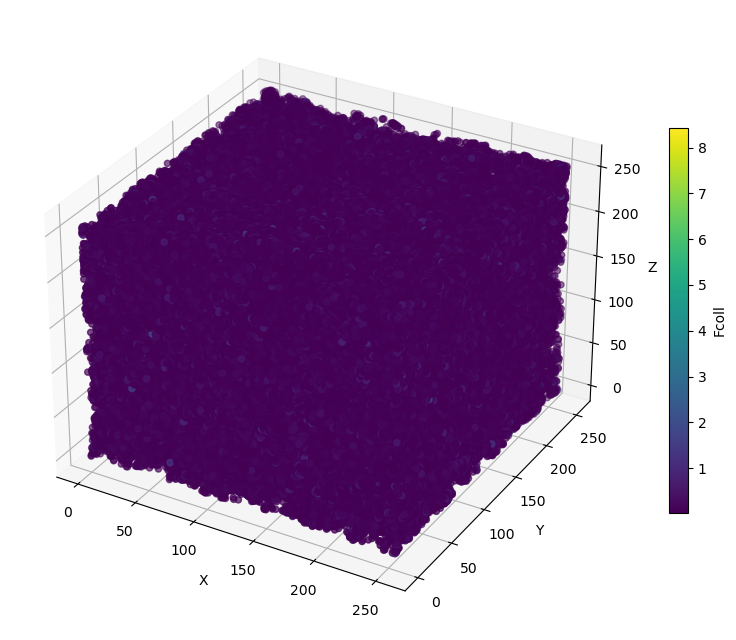

In [80]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fcoll_data = coeval.Fcoll[0]  

# Definir umbral
umbral = 0.03

mask = fcoll_data > umbral

fcoll_data_masked = np.where(mask, fcoll_data, np.nan)

fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

x, y, z = np.where(mask)

scatter = ax.scatter(x, y, z, c=fcoll_data_masked[x, y, z], cmap='viridis')

cbar = plt.colorbar(scatter, shrink=0.5)  
cbar.set_label('Fcoll')

ax.set_xlabel('X')
ax.set_ylabel('Y')
ax.set_zlabel('Z')

plt.rcParams["figure.figsize"] = (10, 10)
plt.show()


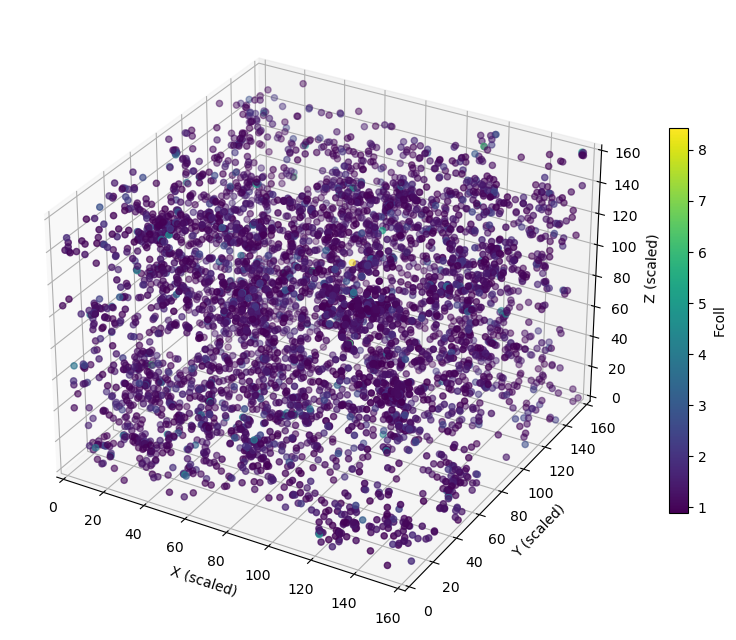

In [81]:
# CAMBIO DE COORDENADAS, de 255 a 160 Mpc

import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fcoll_data = coeval.Fcoll[0]  

# Definir umbral
umbral = 0.9

mask = fcoll_data > umbral
fcoll_data_masked = np.where(mask, fcoll_data, np.nan)

# Definir los parámetros con nuevos nombres
HII_DIM_ini = fcoll_data.shape[0]  # Dimensiones originales
BOX_ini = 160                      # Nueva dimensión

# Función para escalar índices
def scale_indices(indices, original_dim, new_dim):
    return (indices / original_dim) * new_dim

# Obtener las coordenadas de los índices que cumplen con la máscara
x_indices, y_indices, z_indices = np.where(mask)

# Escalar las coordenadas
x_scaled = scale_indices(x_indices, HII_DIM_ini, BOX_ini)
y_scaled = scale_indices(y_indices, HII_DIM_ini, BOX_ini)
z_scaled = scale_indices(z_indices, HII_DIM_ini, BOX_ini)

# Plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

scatter = ax.scatter(x_scaled, y_scaled, z_scaled, c=fcoll_data_masked[x_indices, y_indices, z_indices], cmap='viridis')
cbar = plt.colorbar(scatter, shrink=0.5)
cbar.set_label('Fcoll')

ax.set_xlabel('X (scaled)')
ax.set_ylabel('Y (scaled)')
ax.set_zlabel('Z (scaled)')

# Ajustar límites de los ejes
ax.set_xlim([0, BOX_ini])
ax.set_ylim([0, BOX_ini])
ax.set_zlim([0, BOX_ini])

plt.rcParams["figure.figsize"] = (10, 10)
plt.show()


## Coordenadas (x,y,z) para Fcoll

In [82]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

fcoll_data = coeval.Fcoll[0]  

# Definir umbral
umbral = 0.9

mask = fcoll_data > umbral

fcoll_data_masked = np.where(mask, fcoll_data, np.nan)

x, y, z = np.where(mask)

values = fcoll_data[x, y, z]

if values.size > 0:
    
    max_value = np.nanmax(values)
    min_value = np.nanmin(values)

    
    max_index = np.nanargmax(values)
    max_coord = (x[max_index], y[max_index], z[max_index])

    
    min_index = np.nanargmin(values)
    min_coord = (x[min_index], y[min_index], z[min_index])

    
    print(f'Número de "halos": {len(x)}')
    print(f'Valor máximo de Fcoll: {max_value:.4f}, Coordenada: {max_coord}')
    print(f'Valor mínimo de Fcoll: {min_value:.4f}, Coordenada: {min_coord}')
    print('Coordenadas y valores correspondientes:')
    for i in range(len(x)):
        coord = (x[i], y[i], z[i])
        value = fcoll_data[x[i], y[i], z[i]]
        print(f'Coordenada: {coord}, Valor de Fcoll: {value:.4f}')
#else:
#    print('No hay valores que cumplan con el umbral.')

# Crear gráfico 3D
#fig = plt.figure()
#ax = fig.add_subplot(111, projection='3d')
#scatter = ax.scatter(x, y, z, c=fcoll_data_masked[x, y, z], cmap='viridis')
#cbar = plt.colorbar(scatter, shrink=0.5)  
#cbar.set_label('Fcoll')

#ax.set_xlabel('X')
#ax.set_ylabel('Y')
#ax.set_zlabel('Z')
#plt.rcParams["figure.figsize"] = (10, 10)
#plt.show()


Número de "halos": 4999
Valor máximo de Fcoll: 8.4388, Coordenada: (110, 192, 130)
Valor mínimo de Fcoll: 0.9000, Coordenada: (35, 199, 171)
Coordenadas y valores correspondientes:
Coordenada: (0, 3, 168), Valor de Fcoll: 1.0671
Coordenada: (0, 39, 108), Valor de Fcoll: 1.1262
Coordenada: (0, 78, 238), Valor de Fcoll: 1.0314
Coordenada: (0, 84, 213), Valor de Fcoll: 0.9127
Coordenada: (0, 101, 200), Valor de Fcoll: 1.0040
Coordenada: (0, 105, 28), Valor de Fcoll: 1.0784
Coordenada: (0, 108, 121), Valor de Fcoll: 0.9255
Coordenada: (0, 115, 118), Valor de Fcoll: 1.3178
Coordenada: (0, 139, 169), Valor de Fcoll: 1.0593
Coordenada: (0, 149, 1), Valor de Fcoll: 1.1244
Coordenada: (0, 156, 196), Valor de Fcoll: 3.6804
Coordenada: (0, 200, 251), Valor de Fcoll: 1.0474
Coordenada: (0, 205, 109), Valor de Fcoll: 1.3953
Coordenada: (0, 209, 46), Valor de Fcoll: 1.7384
Coordenada: (0, 209, 158), Valor de Fcoll: 0.9740
Coordenada: (0, 228, 235), Valor de Fcoll: 1.8804
Coordenada: (0, 239, 209), V

# ______________________________________________________________

In [83]:
# Uso los colores del  21cmFAST    EoR colour
import matplotlib.pyplot as plt
import matplotlib.colors as mcolors

EoR_colour = mcolors.LinearSegmentedColormap.from_list(
    'mycmap',
    [(0, 'white'), (0.33, 'yellow'), (0.5, 'orange'), (0.68, 'red'),
     (0.83333, 'black'), (0.9, 'blue'), (1, 'cyan')]
)

# Utilizar el colormap directamente en una visualización
#plt.imshow([[0, 1], [1, 0]], cmap=EoR_colour)
#plt.colorbar()
#plt.show()


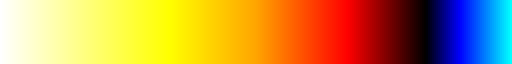

In [84]:
EoR_colour 

# _____________________________________________________________

## ● Trabajamos en rebanadas

Ambos códigos tienen como objetivo visualizar datos en 2D a partir de coordenadas 3D, pero cada uno lo hace de manera diferente y para propósitos distintos. A continuación, te explico las diferencias clave entre ellos:

### 1. **Filtrado de Datos en el Eje Z**

- **Primer Código:**
  - Filtra las coordenadas dentro de un rango específico de `z` (`z_min` a `z_max`).
  - **Rango de Z:** El filtrado se realiza usando un rango fijo en el eje `z` y se visualiza toda la información en ese rango.
  - **Uso:** Este enfoque es útil cuando deseas ver cómo se distribuyen los datos en el espacio 2D para un rango específico en el eje `z`.

- **Segundo Código:**
  - Filtra las coordenadas para una "rebanada" de `z` usando un índice de `z` (`z_index`) y un espesor (`delta_z`).
  - **Rebanada en el Eje Z:** El filtrado se realiza usando una máscara que selecciona todos los puntos dentro de una cierta distancia (espesor) alrededor de un índice central de `z`.
  - **Uso:** Este enfoque es útil para visualizar un plano específico en el eje `z` con un espesor determinado, lo que permite analizar una sección transversal del espacio.

### 2. **Definición de Parámetros de Filtrado**

- **Primer Código:**
  - **Parámetros de Filtrado:** `z_min` y `z_max` definen los límites inferior y superior del rango de `z` para la visualización.
  - **Efecto:** Muestra una visualización de los datos que caen dentro de ese rango específico de `z`.

- **Segundo Código:**
  - **Parámetros de Filtrado:** `z_index` y `delta_z` definen el índice del plano central y el espesor de la rebanada.
  - **Efecto:** Muestra una visualización de los datos en una rebanada del espacio alrededor del índice `z` con un espesor especificado.

### 3. **Configuración del Gráfico**

- **Primer Código:**
  - **Gráfico 2D:** El gráfico es una visualización 2D de los datos filtrados en el rango de `z`, con etiquetas y título que reflejan ese rango.
  - **Configuración:** El gráfico utiliza una sola visualización sin configuraciones avanzadas para la visualización de la rebanada.

- **Segundo Código:**
  - **Gráfico 2D:** El gráfico es una visualización 2D de los datos filtrados en una rebanada del espacio z.
  - **Configuración:** Incluye configuraciones adicionales como `plt.xlim` y `plt.ylim` para ajustar los límites del gráfico, y `plt.grid(True)` para mejorar la legibilidad del gráfico.


### **POr lo tanto tenemos...**
- **Primer Código:** Focaliza en un rango específico en `z` para visualizar cómo se distribuyen los puntos en ese rango.
- **Segundo Código:** Focaliza en una rebanada en torno a un índice `z` con un espesor determinado, proporcionando una visión más detallada de una sección del espacio.


## CODIGO 1

## Visualizacon de los datos en 2D (C1)

## HALOS

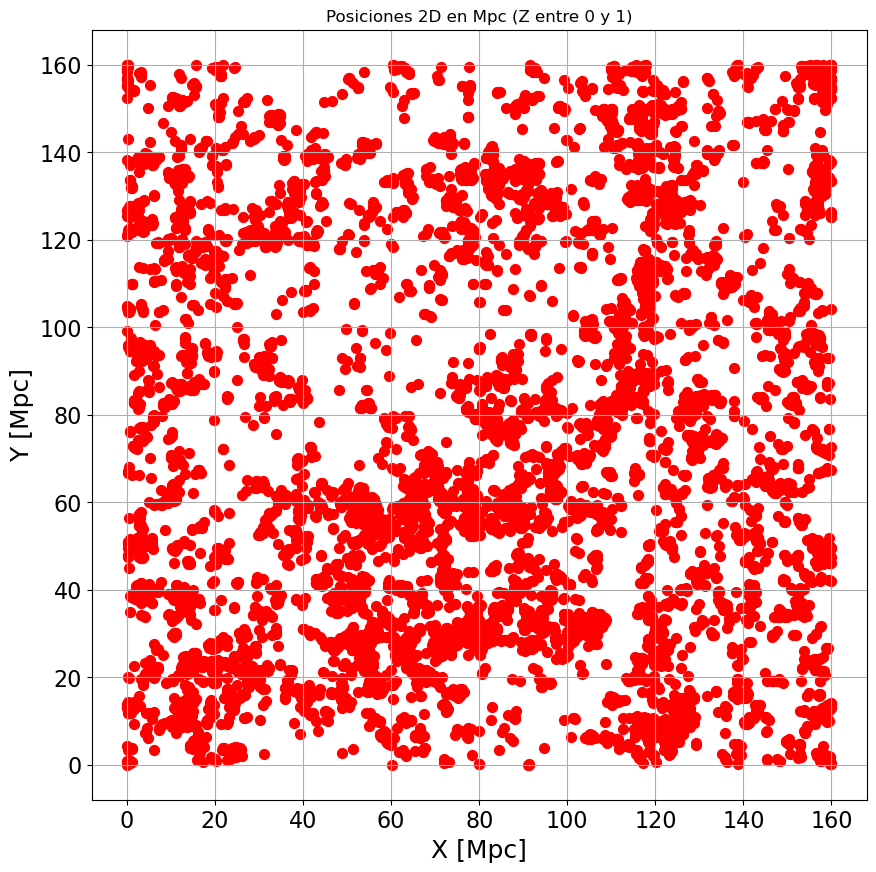

In [90]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()
DIM = 1023


# Parámetros de la simulación
#BOX_LEN = coeval.user_params.BOX_LEN  # Mpc
#DIM = coeval.user_params.DIM
#DIM = 255

indices_x = x_1
indices_y = y_2
indices_z = z_3

# Convertir los índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN/ DIM)*index
    #return (index / DIM) * BOX_LEN

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)
    #print("Posiciones 3D en Mpc:")
    #print(positions_3d_mpc)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como mximo 150
    zmax = 1 # como maximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Graficar los datos filtrados en 2D
    plt.figure(figsize=(10, 10))
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='r', marker='o', s=50)
    plt.xlabel('X [Mpc]', fontsize=18)
    plt.ylabel('Y [Mpc]', fontsize=18)
    
    
    #plt.xlabel('X (Mpc)')
    #plt.ylabel('Y (Mpc)')
    plt.title(f'Posiciones 2D en Mpc (Z entre {zmin} y {zmax})')
    plt.grid(True)
    plt.tick_params(axis='both', labelsize=16)  

    plt.show()




## <span style="color: red;">OPCIONAL</span> 

## CODIGO 2

## Visualizacon de los datos en 2D (C2)

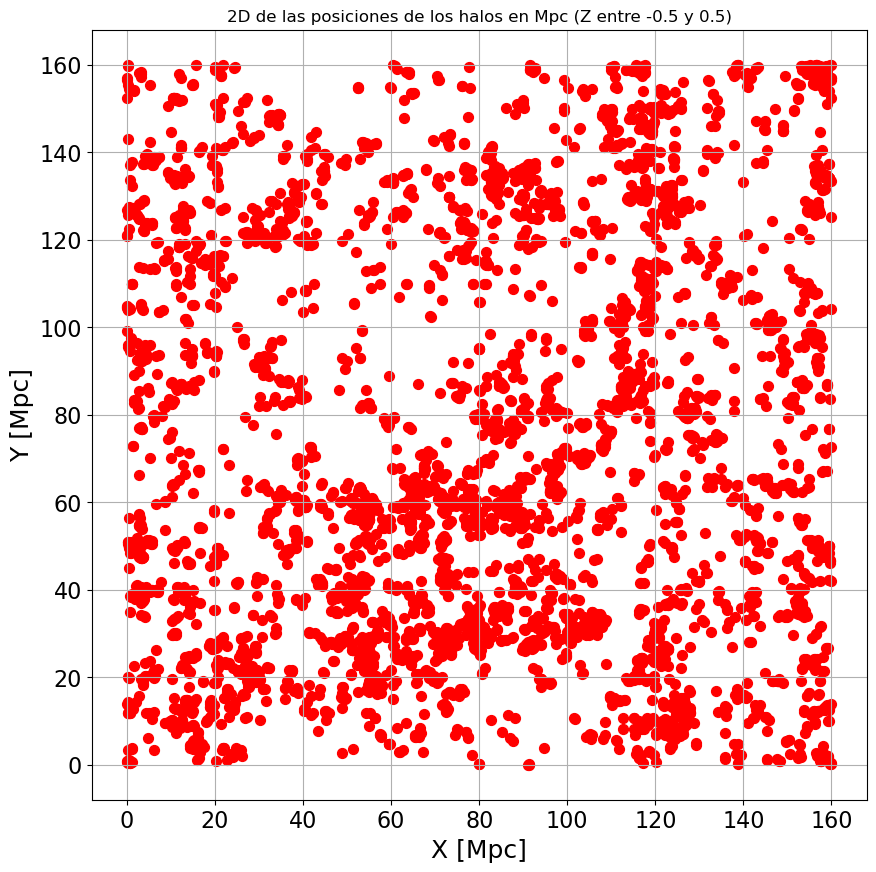

In [89]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Mpc
#DIM = coeval.user_params.DIM
#DIM = halos.halo_coords.max()


DIM=1023

indices_x = x_1
indices_y = y_2
indices_z = z_3

# Convertir los índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN/ DIM)*index

#    return (index / DIM) * BOX_LEN

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

# Comprobar que los arrays de índices tengan la misma longitud

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)
    #print("Posiciones 3D en Mpc:")
    #print(positions_3d_mpc)

    # Parámetros para la rebanada en el eje Z
    z_index = 0  # Índice del plano en el eje z (va de 0 a 150 Mpc)
    delta_z = 1  # Espesor de la rebanada

    # Definir el rango para la rebanada en el eje z
    z_range = (z_index - delta_z / 2, z_index + delta_z / 2)
    
    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= z_range[0]) & (positions_z_mpc <= z_range[1])
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Graficar los datos filtrados en 2D
    plt.figure(figsize=(10, 10))
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='r', marker='o', s=50)
    plt.xlabel('X [Mpc]', fontsize=18)
    plt.ylabel('Y [Mpc]', fontsize=18)
    plt.title(f'2D de las posiciones de los halos en Mpc (Z entre {z_range[0]} y {z_range[1]})')
    plt.grid(True)
    plt.tick_params(axis='both', labelsize=16)  

    plt.show()

#else:
#    print("Los arrays de índices no tienen la misma longitud. No se puede combinar en una matriz 3D.")


#  _________________________________________________________________

# PARTE IV

## Plots de los campos y los HALOS superpuestos
### Como teniamos el campo de densidad...

In [91]:
#plotting.coeval_sliceplot(coeval, "density", slice_axis=-1, slice_index=0)

In [92]:
#plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=0, cbar=None)

#plt.savefig('hires_densityCONmini.jpg', dpi=300, bbox_inches='tight')



# i) Densidad ($\delta$) +HALOS

## Todos los datos proyectados en (x,y) + las coordenadas de los halos

## Datos en rebanadas para la densidad


In [96]:
# Esta parte dle codigo esta bien

<Figure size 1000x1000 with 0 Axes>

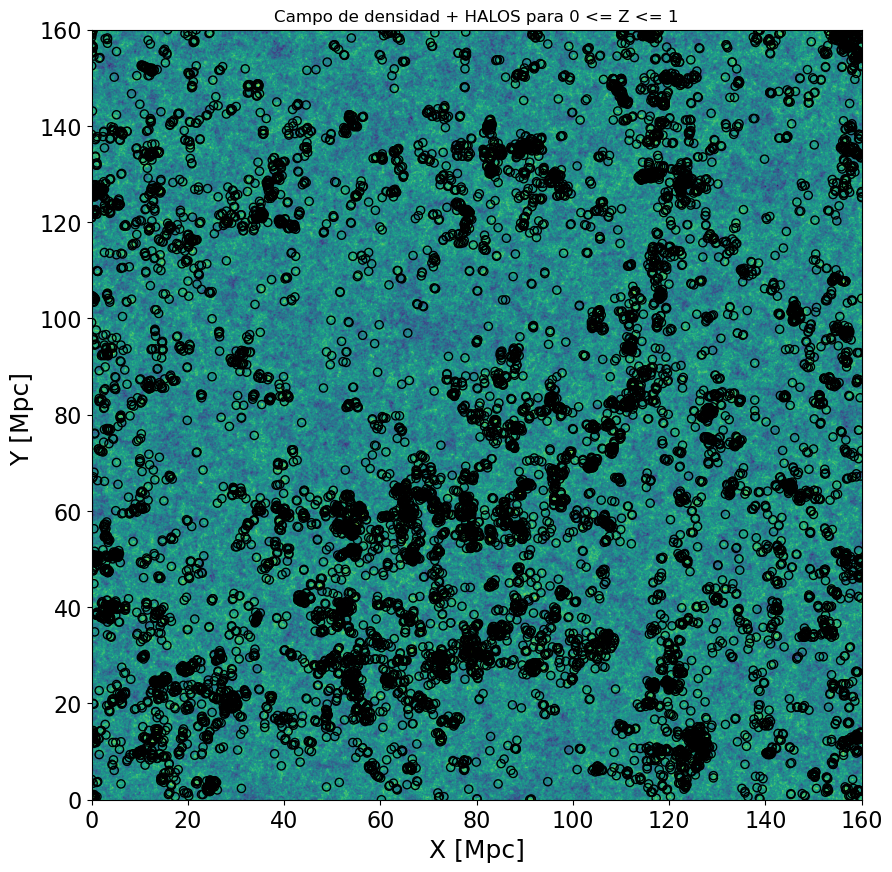

In [95]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
#BOX_LEN = coeval.user_params.BOX_LEN  # Mpc
DIM = 1023

BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()


# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0 # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Graficar la rebanada con la función coeval_sliceplot
    plt.figure(figsize=(10, 10))
    plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=0, cbar=None)
    plt.title(f'Campo de densidad + HALOS para {zmin} <= Z <= {zmax}')
    #plt.grid(True)
    
    # Añadir puntos filtrados en el gráfico
    
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc,
                facecolor='none',          # Relleno transparente
                edgecolor='black',        # Color del borde negro
                linewidths=1,             # Grosor del borde
                marker='o',               # Forma del marcador
                s=35,                     # Tamaño del círculo
                alpha=1,                  # Opacidad (1 para opaco)
                label='Halos')
    
   # plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='r',
    #            edgecolor='black',     # Color del borde
    #            linewidths=2,          # Grosor del borde,
    #            marker='o', s=35, alpha=1 ,label='Halos')
    #plt.xlabel('X (Mpc)')
    #plt.ylabel('Y (Mpc)')
    
    plt.xlabel('X [Mpc]', fontsize=18)
    plt.ylabel('Y [Mpc] ', fontsize=18)
    plt.tick_params(axis='both', labelsize=16)  

    
    #plt.legend()
    plt.savefig('hires_density SIN mini halos.jpg', dpi=300, bbox_inches='tight')
    plt.show()


# Plot: campo de densidad+halos+Fcoll+FcollMINI

# SIN MINI HALOS

Número de halos (Fcoll) en el rango de z (0, 1): 5292


<Figure size 1000x1000 with 0 Axes>

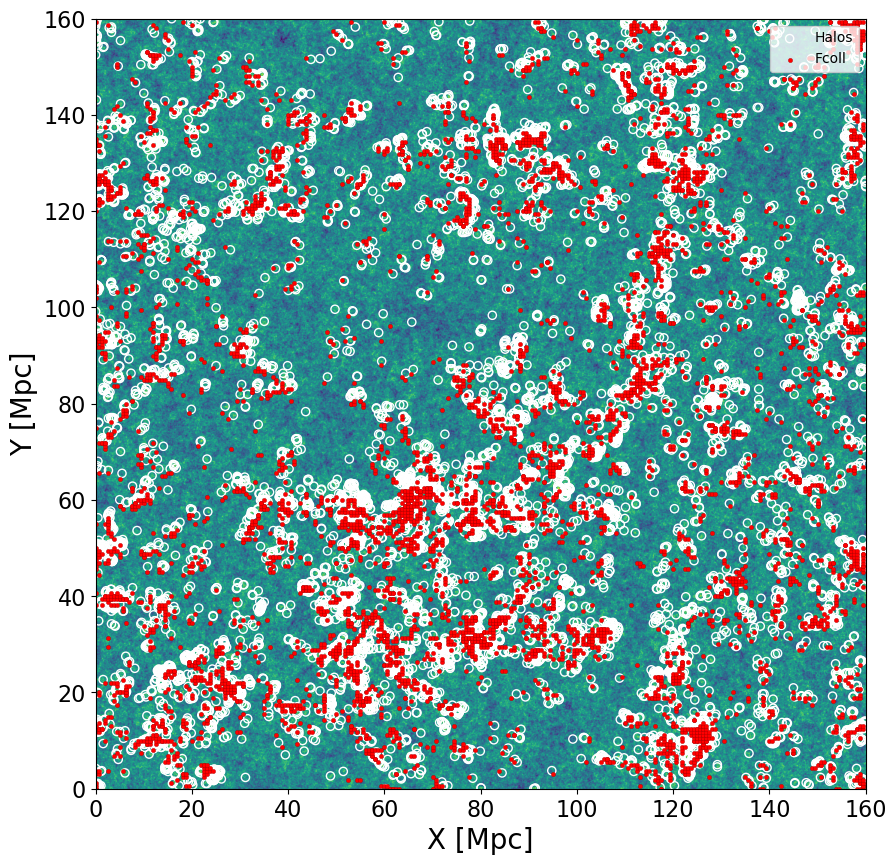

In [110]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
#DIM = halos.halo_coords.max()  # Dimensión original (128)
DIM=1023
# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll
    W = 0
    fcoll_data = coeval.Fcoll[W]

    # Umbral
    umbral = 0.003

    # Máscara para Fcoll
    mask_fcoll = fcoll_data > umbral
    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    # Crear máscara para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)
    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')

    plt.figure(figsize=(10, 10))

    # Mostrar la rebanada de densidad
    plotting.coeval_sliceplot(coeval, "hires_density", slice_axis=-1, slice_index=1,cbar=None )
    #plt.title(f'Rebanada de densidad para {zmin} <= Z <= {zmax}')

    # Mostrar halos
    #plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=20, label='Halos')
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
            facecolor='None', edgecolor='white', marker='o', s=35,linewidths=1, label='Halos')
    
    
    # Mostrar Fcoll en la rebanada
    #plt.scatter(x_fcoll_slice, y_fcoll_slice, c='red', label='Fcoll', alpha=0.6, s=50)

    #plt.scatter(
    #    x_fcoll_slice, y_fcoll_slice,
    #    c='None',               # Color del punto
    #    edgecolor='darkred',     # Color del borde
    #    linewidths=1,          # Grosor del borde
    #    label='Fcoll',
    #    alpha=1,
    #    s=10
    #        )
    
    
    #    x_fcoll_slice, y_fcoll_slice,     
    plt.scatter(
    x_fcoll_slice, y_fcoll_slice,
    c='red',               # Color del punto
    edgecolor='darkred',     # Color del borde
    linewidths=0.2,          # Grosor del borde
    label='Fcoll',
    alpha=1,
    s=10
)
    
  
    
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10)
    plt.tick_params(axis='both', labelsize=16)  
    
    
    #plt.xlabel('X [Mpc]')
    #plt.ylabel('Y [Mpc]')
    #plt.legend(loc='upper right')
    #plt.legend()
    plt.savefig('hires_density_with_Halos_Fcoll.jpg', dpi=300, bbox_inches='tight')
    plt.show()


# ii) Temperatura de brillo ($\delta Tb$) + HALOS

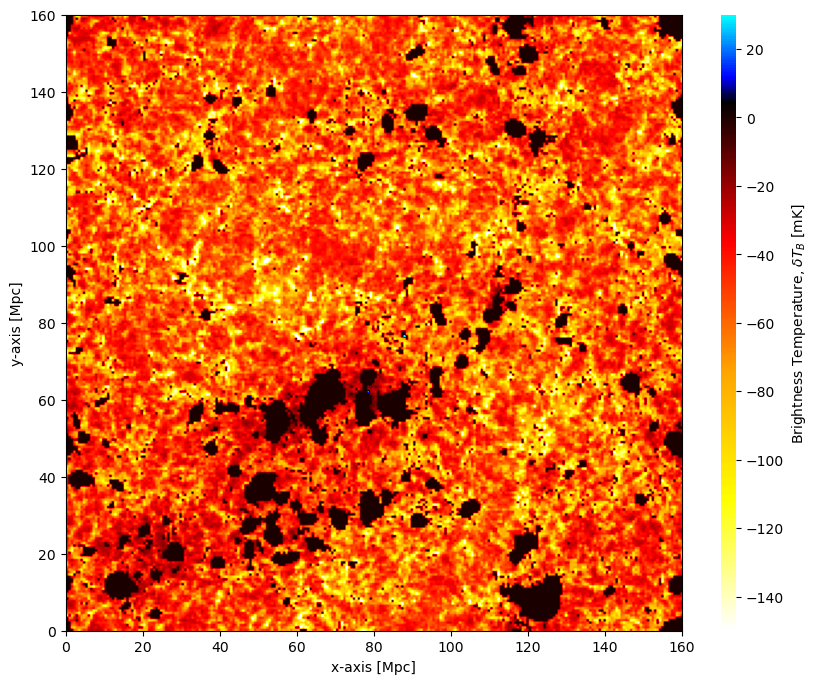

In [97]:
# Comprobando los ejes...
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
#plotting.coeval_sliceplot(coeval, "brightness_temp",slice_axis=-1, slice_index=6)
plt.savefig('brightness_temp SIN mini.jpg', dpi=300, bbox_inches='tight')

# SIN MINI HALOS

Número de halos (Fcoll) en el rango de z (0, 1): 5292


<Figure size 1000x1000 with 0 Axes>

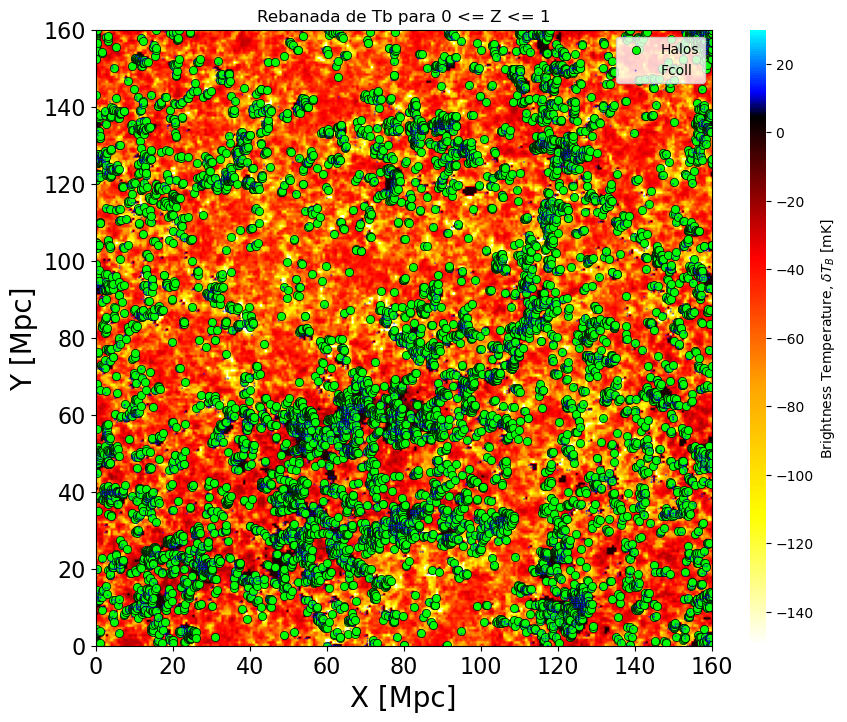

In [100]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
DIM = halos.halo_coords.max()  # Dimensión original (128)

# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1 # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll
    W = 0
    fcoll_data = coeval.Fcoll[W]

    # Umbral
    umbral = 0.003

    # Máscara para Fcoll
    mask_fcoll = fcoll_data > umbral

    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)

    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)

    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)

    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')

    # PLOT de la rebanada 2D con halos y Fcoll
    plt.figure(figsize=(10, 10))

    # Mostrar la rebanada de densidad
    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=1, cbar=True, ax=ax)
    

    
    #plotting.coeval_sliceplot(coeval, "brightness_temp", slice_axis=-1, slice_index=6)
    plt.title(f'Rebanada de Tb para {zmin} <= Z <= {zmax}')

    # Halos
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime',edgecolor='black',     # Color del borde
        linewidths=0.5,  marker='o', s=35, label='Halos')

    # Fcoll en la rebanada
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='b',               # Color del punto
        edgecolor='None',     # Color del borde
        linewidths=0.2,          # Grosor del borde
        label='Fcoll',
        alpha=0.5,
        s=2
            )
    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10)
    plt.tick_params(axis='both', labelsize=16)  
    
    #plt.xlabel('X [Mpc]')
    #plt.ylabel('Y [Mpc]')
    #plt.legend(loc='upper right')

    #plt.legend()
    plt.savefig('Tb_with_Halos_Fcoll.jpg', dpi=300, bbox_inches='tight')
    plt.show()


# iii) Campo Ionizante ($\ X HII $) + HALOS

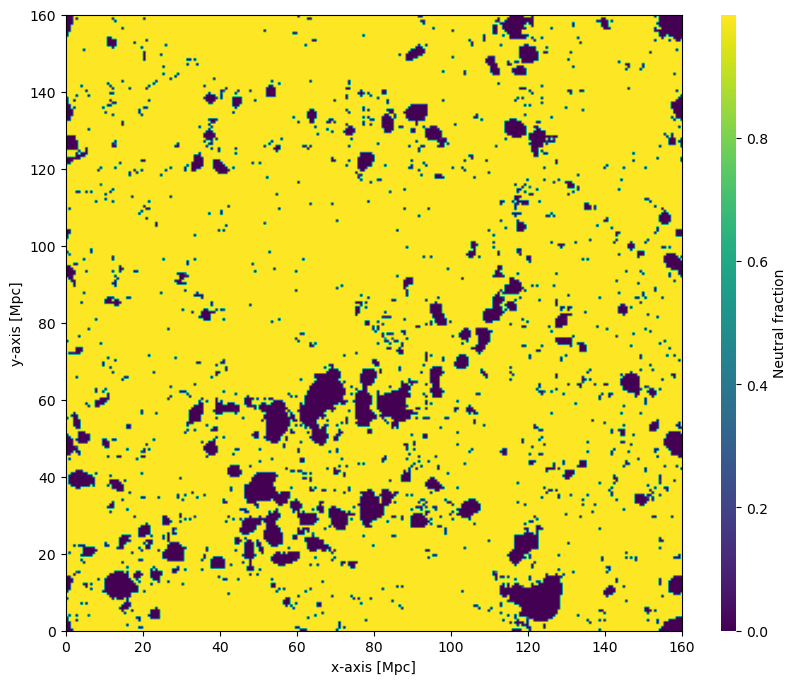

In [101]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=0, cbar=True, ax=ax)
    
#plotting.coeval_sliceplot(coeval, "xH_box",slice_axis=-1, slice_index=6, cbar = True)
#im = plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6, cbar=True, cmap='viridis', ax=ax)

# SIN MINI HALOS

Número de halos (Fcoll) en el rango de z (0, 1): 5292


<Figure size 1000x1000 with 0 Axes>

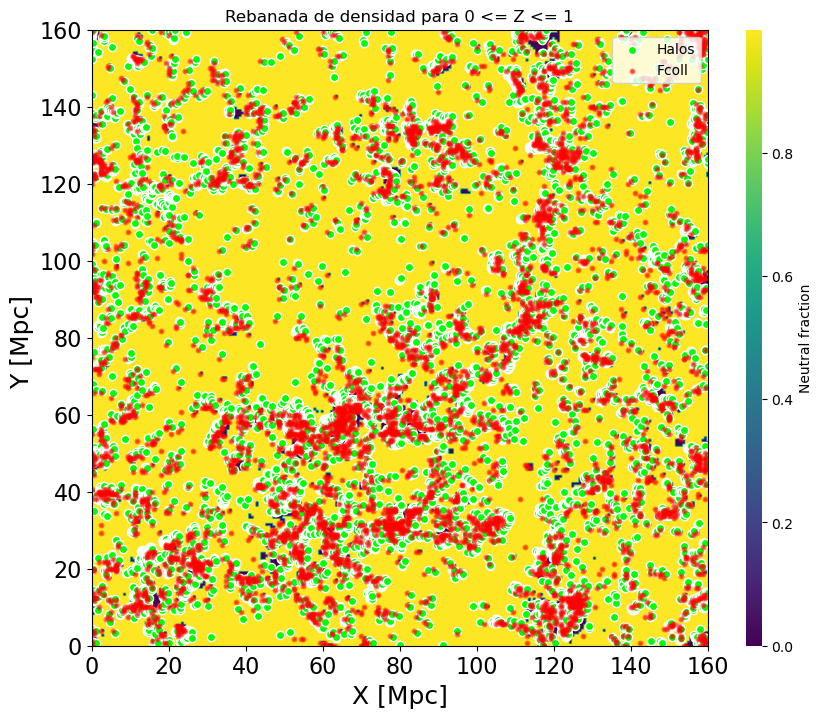

In [102]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
DIM = halos.halo_coords.max()  # Dimensión original (128)

# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll
    W = 0
    fcoll_data = coeval.Fcoll[W]

    # Umbral
    umbral = 0.003

    # Máscara para Fcoll
    mask_fcoll = fcoll_data > umbral

    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)

    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)

    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)

    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')

    # PLOT de la rebanada 2D con halos y Fcoll
    plt.figure(figsize=(10, 10))

    # Mostrar la rebanada de densidad
    
    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=0, cbar=True, cmap='viridis', ax=ax)
    
    #plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=6, cbar=True)
    plt.title(f'Rebanada de densidad para {zmin} <= Z <= {zmax}')

    # Halos
   # plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=35, label='Halos')

    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, 
            facecolor='lime', edgecolor='white', marker='o', s=35,linewidths=1, label='Halos')
    
    
    
    
    # Fcoll en la rebanada
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='red',               # Color del punto
        edgecolor='red',     # Color del borde
        linewidths=2,          # Grosor del borde
        label='Fcoll',
        alpha=0.5,
        s=5
    )
  
  
    plt.xlabel('X [Mpc]', fontsize=18)
    plt.ylabel('Y [Mpc] ', fontsize=18)
    
    plt.legend(loc='upper right')
    plt.tick_params(axis='both', labelsize=16)  

#    plt.legend()
    plt.savefig('IONIZACION_BOX_fcoll.jpg', dpi=300, bbox_inches='tight')
    plt.show()


# Ts

Número de halos (Fcoll) en el rango de z (0, 1): 5292


<Figure size 1000x1000 with 0 Axes>

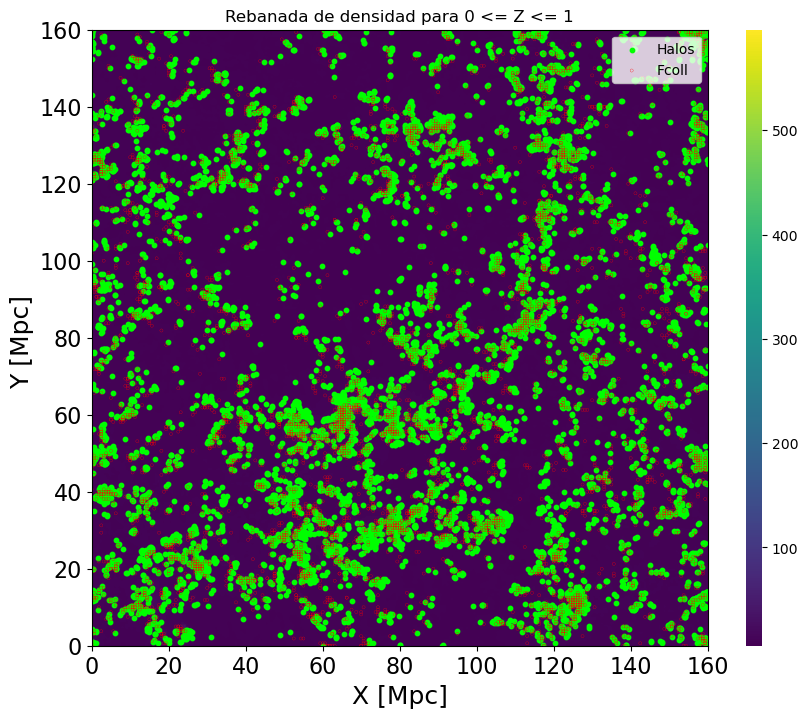

In [104]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
DIM = halos.halo_coords.max()  # Dimensión original (128)

# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll
    W = 0
    fcoll_data = coeval.Fcoll[W]

    # Umbral
    umbral = 0.003

    # Máscara para Fcoll
    mask_fcoll = fcoll_data > umbral

    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)

    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)

    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)

    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')

    # PLOT de la rebanada 2D con halos y Fcoll
    plt.figure(figsize=(10, 10))

    # Mostrar la rebanada de densidad
#    plotting.coeval_sliceplot(coeval, "xH_box", slice_axis=-1, slice_index=1)

    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "Ts_box", slice_axis=-1, slice_index=1, cbar=True, ax=ax)
    


    #plotting.coeval_sliceplot(coeval, "Ts_box",slice_axis=-1, slice_index=6)

    plt.title(f'Rebanada de densidad para {zmin} <= Z <= {zmax}')

    # Halos
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=10, label='Halos')

    # Fcoll en la rebanada
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='None',               # Color del punto
        edgecolor='r',     # Color del borde
        linewidths=0.2,          # Grosor del borde
        label='Fcoll',
        alpha=1,
        s=5
    )
    
    plt.xlabel('X [Mpc]',  fontsize=18)
    plt.ylabel('Y [Mpc] ', fontsize=18)
    plt.tick_params(axis='both', labelsize=16)  

    #plt.xlabel('X [Mpc]')
    #plt.ylabel('Y [Mpc]')
    plt.legend(loc='upper right')

#    plt.legend()
    #plt.savefig('Ts_BOX_fcoll.jpg', dpi=300, bbox_inches='tight')
    plt.show()

In [105]:
#plotting.coeval_sliceplot(coeval, "Ts_box",slice_axis=-1, slice_index=0)


# iv) Temperatura cinetica (Tk) + HALOS

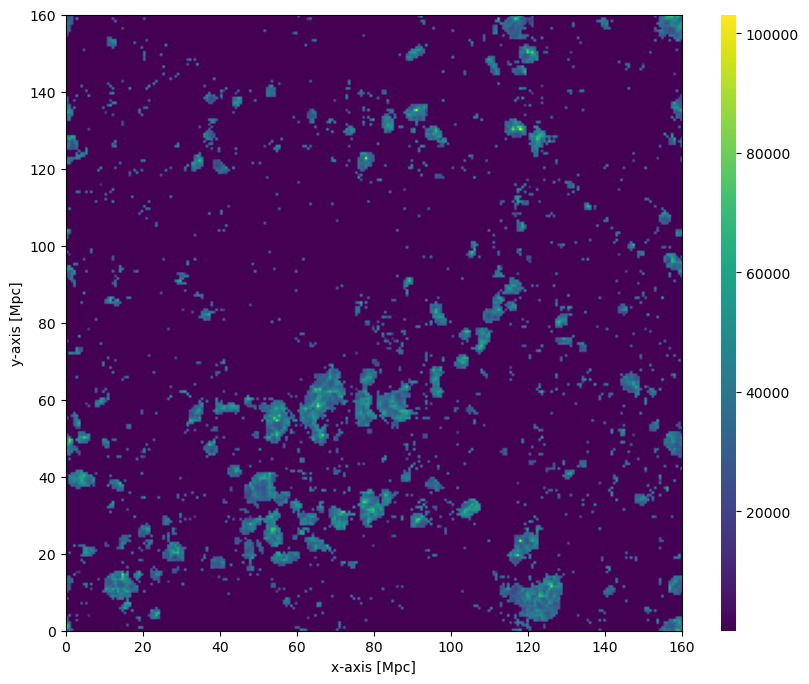

In [106]:
fig, ax = plt.subplots(figsize=(10, 8))  
im = plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=0, cbar=True, ax=ax)

Número de halos (Fcoll) en el rango de z (0, 1): 5292


<Figure size 1000x1000 with 0 Axes>

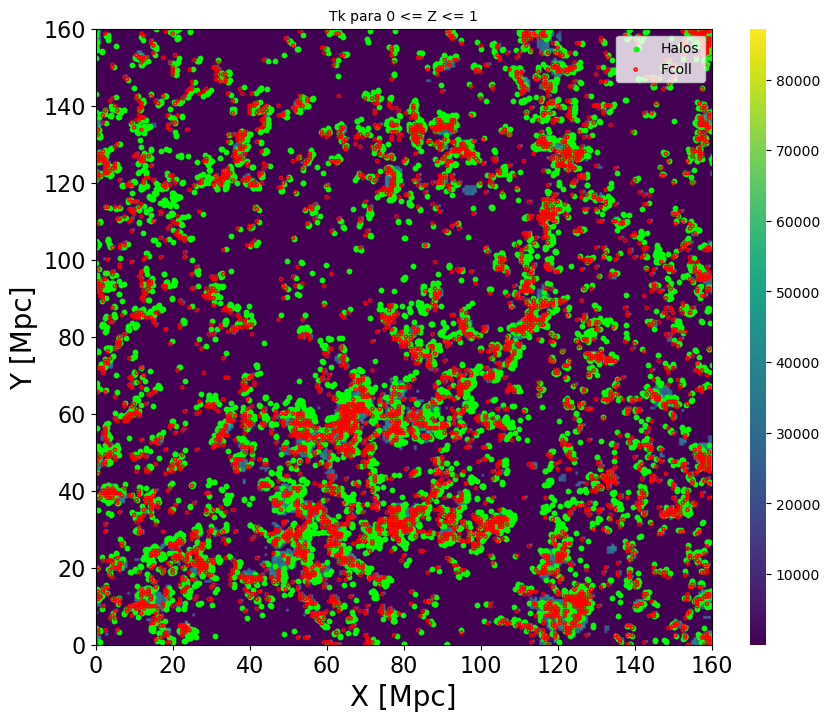

In [107]:
import numpy as np
import matplotlib.pyplot as plt

# Parámetros de la simulación
BOX_LEN = coeval.user_params.BOX_LEN  # Longitud de la caja en Mpc
DIM = halos.halo_coords.max()  # Dimensión original (128)

# Convertir índices a posiciones en Mpc
def index_to_mpc(index, BOX_LEN, DIM):
    return (BOX_LEN / DIM) * index

# Datos para los halos
indices_x = x_1
indices_y = y_2
indices_z = z_3

positions_x_mpc = index_to_mpc(indices_x, BOX_LEN, DIM)
positions_y_mpc = index_to_mpc(indices_y, BOX_LEN, DIM)
positions_z_mpc = index_to_mpc(indices_z, BOX_LEN, DIM)

if len(indices_x) == len(indices_y) == len(indices_z):
    positions_3d_mpc = np.stack([positions_x_mpc, positions_y_mpc, positions_z_mpc], axis=-1)

    # Definir el rango para la rebanada en el eje z
    zmin = 0  # como máximo 150
    zmax = 1  # como máximo 150

    # Filtrar los datos en función del rango z
    mask = (positions_z_mpc >= zmin) & (positions_z_mpc <= zmax)
    filtered_positions_x_mpc = positions_x_mpc[mask]
    filtered_positions_y_mpc = positions_y_mpc[mask]

    # Datos de Fcoll
    W = 0
    fcoll_data = coeval.Fcoll[W]

    # Umbral
    umbral = 0.003

    # Máscara para Fcoll
    mask_fcoll = fcoll_data > umbral
    fcoll_data_masked = np.where(mask_fcoll, fcoll_data, np.nan)

    # Escalar índices
    original_dim = fcoll_data.shape[0]  # Dimensiones originales (128)
    new_dim = 160  # Nueva dimensión

    def scale_indices(indices, orig_dim, new_dim):
        return (indices / orig_dim) * new_dim

    x_fcoll, y_fcoll, z_fcoll = np.where(mask_fcoll)
    x_fcoll_scaled = scale_indices(x_fcoll, original_dim, new_dim)
    y_fcoll_scaled = scale_indices(y_fcoll, original_dim, new_dim)
    z_fcoll_scaled = scale_indices(z_fcoll, original_dim, new_dim)

    # Crear máscaras para la rebanada en el rango z
    mask_z_slice_fcoll = (z_fcoll_scaled >= zmin) & (z_fcoll_scaled <= zmax)
    x_fcoll_slice = x_fcoll_scaled[mask_z_slice_fcoll]
    y_fcoll_slice = y_fcoll_scaled[mask_z_slice_fcoll]

    num_halos_fcoll = np.sum(mask_z_slice_fcoll)
    print(f'Número de halos (Fcoll) en el rango de z ({zmin}, {zmax}): {num_halos_fcoll}')

    # PLOT de la rebanada 2D con halos y Fcoll
    plt.figure(figsize=(10, 10))

    # Mostrar la rebanada de densidad
    fig, ax = plt.subplots(figsize=(10, 8))  
    im = plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=1, cbar=True, ax=ax)
       
    
    #plotting.coeval_sliceplot(coeval, "temp_kinetic_all_gas", slice_axis=-1, slice_index=6 )
    
    plt.title(f'Tk para {zmin} <= Z <= {zmax}', fontsize=10)
    
    # Halos
    plt.scatter(filtered_positions_x_mpc, filtered_positions_y_mpc, c='lime', marker='o', s=10, label='Halos')

    # Fcoll en la rebanada
    plt.scatter(
        x_fcoll_slice, y_fcoll_slice,
        c='None',
        edgecolor='r',
        linewidths=1,
        label='Fcoll',
        alpha=1,
        s=5
    )

    plt.xlabel('X [Mpc]', fontsize=20)
    plt.ylabel('Y [Mpc]', fontsize=20)
    plt.legend(loc='upper right', fontsize=10)
    plt.tick_params(axis='both', labelsize=16)  

    
    plt.savefig('Tk_fcoll.jpg', dpi=300, bbox_inches='tight')
    plt.show()


In [108]:
coeval.astro_params.pystruct

{'HII_EFF_FACTOR': 30.0,
 'F_STAR10': 0.05011872336272722,
 'ALPHA_STAR': 0.5,
 'ALPHA_STAR_MINI': 0.5,
 'F_ESC10': 0.1,
 'ALPHA_ESC': -0.5,
 'M_TURN': 501187233.6272715,
 'F_STAR7_MINI': 0.006025595860743574,
 'F_ESC7_MINI': 0.0031622776601683794,
 'R_BUBBLE_MAX': 50.0,
 'ION_Tvir_MIN': 49999.9995007974,
 'F_H2_SHIELD': 0.0,
 'L_X': 1e+40,
 'L_X_MINI': 1e+40,
 'NU_X_THRESH': 500.0,
 'X_RAY_SPEC_INDEX': 1.0,
 'X_RAY_Tvir_MIN': 49999.9995007974,
 'A_LW': 2.0,
 'BETA_LW': 0.6,
 'A_VCB': 1.0,
 'BETA_VCB': 1.8,
 't_STAR': 0.5,
 'N_RSD_STEPS': 20}

# HMF

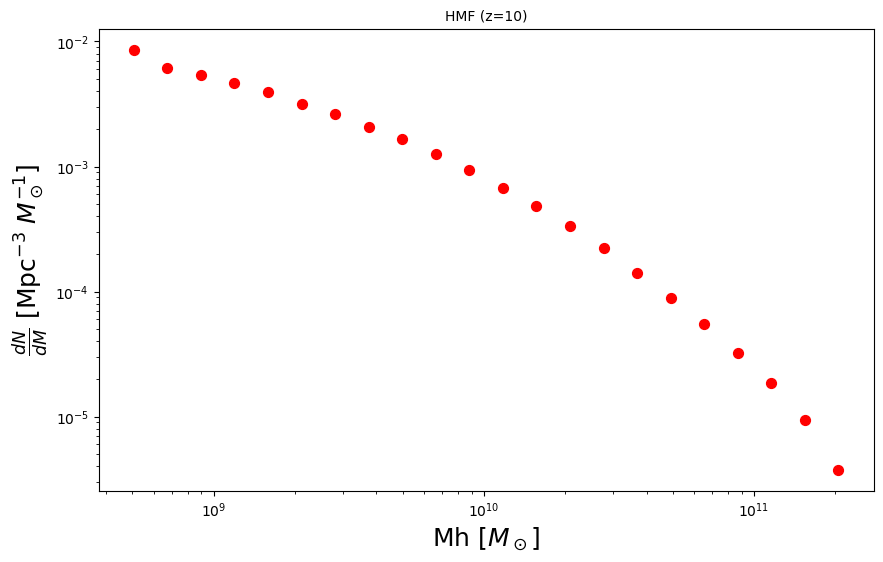

In [109]:
import numpy as np
import matplotlib.pyplot as plt

mass_bins = halos.mass_bins
fgtrm = halos.fgtrm  

plt.figure(figsize=(10, 6))

plt.scatter(mass_bins, fgtrm, label='Término fgtrm', color='red', s=50)  

plt.xscale('log')
plt.yscale('log')

plt.xlabel(r'Mh [$M_\odot$]', fontsize=18)

#   plt.ylabel(r'$\frac{dN}{dM}$ ()', fontsize=16)  
plt.ylabel(r'$\frac{dN}{dM}$ [Mpc$^{-3}$ $M_\odot^{-1}$]', fontsize=18)




plt.title('HMF (z=10)', fontsize=10)  
#plt.grid()
plt.savefig('HMF.jpg', dpi=300, bbox_inches='tight')

plt.show()
